In [1]:
# """
# Performing camera calibration by 
# passing the value of known 3D points (objpoints)
# and corresponding pixel coordinates of the 
# detected corners (imgpoints)
# """
# ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

# print("Camera matrix : \n")
# print(mtx)
# print("dist : \n")
# print(dist)
# print("rvecs : \n")
# print(rvecs)
# print("tvecs : \n")
# print(tvecs)

In [2]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt


In [3]:
# Defining the dimensions of checkerboard
CHECKERBOARD = (6, 9)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Creating vector to store vectors of 3D points for each checkerboard image
objpoints = []
# Creating vector to store vectors of 2D points for each checkerboard image
imgpoints = [] 


In [4]:
# Defining the world coordinates for 3D points
objp = np.zeros((1, CHECKERBOARD[0]*CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
prev_img_shape = None

print(len(objpoints))

# Extracting path of individual image stored in a given directory
images = glob.glob('./Q4_ChessBoard_Dataset/*.jpg')
sorted(images)

total_images = len(images)

print(f"Total Images:{total_images}")

0
Total Images:25


In [5]:
print(images)

['./Q4_ChessBoard_Dataset\\image_01.jpg', './Q4_ChessBoard_Dataset\\image_02.jpg', './Q4_ChessBoard_Dataset\\image_03.jpg', './Q4_ChessBoard_Dataset\\image_04.jpg', './Q4_ChessBoard_Dataset\\image_05.jpg', './Q4_ChessBoard_Dataset\\image_06.jpg', './Q4_ChessBoard_Dataset\\image_07.jpg', './Q4_ChessBoard_Dataset\\image_08.jpg', './Q4_ChessBoard_Dataset\\image_09.jpg', './Q4_ChessBoard_Dataset\\image_10.jpg', './Q4_ChessBoard_Dataset\\image_11.jpg', './Q4_ChessBoard_Dataset\\image_12.jpg', './Q4_ChessBoard_Dataset\\image_13.jpg', './Q4_ChessBoard_Dataset\\image_14.jpg', './Q4_ChessBoard_Dataset\\image_15.jpg', './Q4_ChessBoard_Dataset\\image_16.jpg', './Q4_ChessBoard_Dataset\\image_17.jpg', './Q4_ChessBoard_Dataset\\image_18.jpg', './Q4_ChessBoard_Dataset\\image_19.jpg', './Q4_ChessBoard_Dataset\\image_20.jpg', './Q4_ChessBoard_Dataset\\image_21.jpg', './Q4_ChessBoard_Dataset\\image_22.jpg', './Q4_ChessBoard_Dataset\\image_23.jpg', './Q4_ChessBoard_Dataset\\image_24.jpg', './Q4_ChessBoar

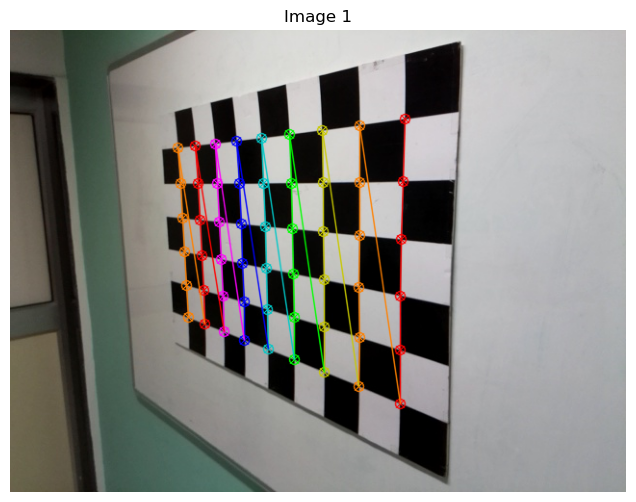

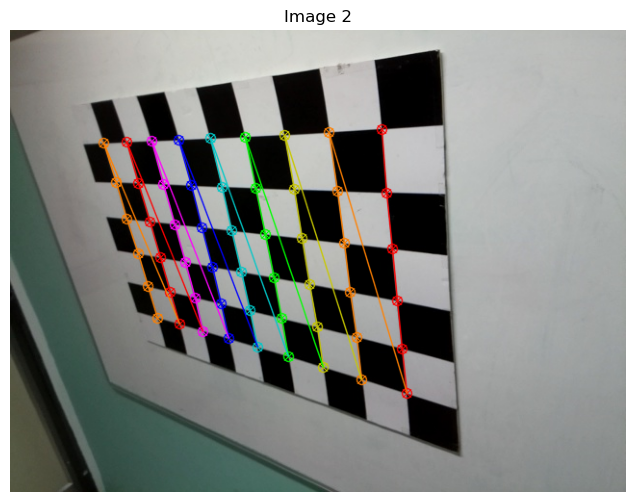

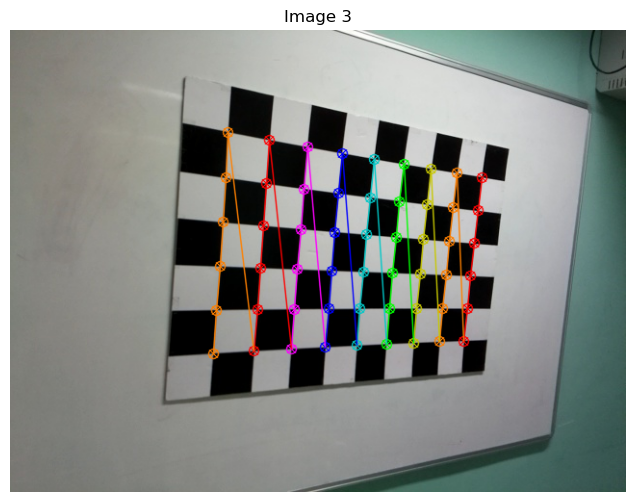

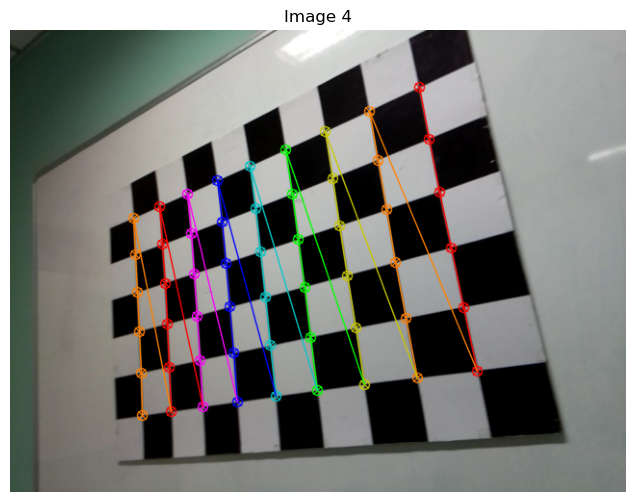

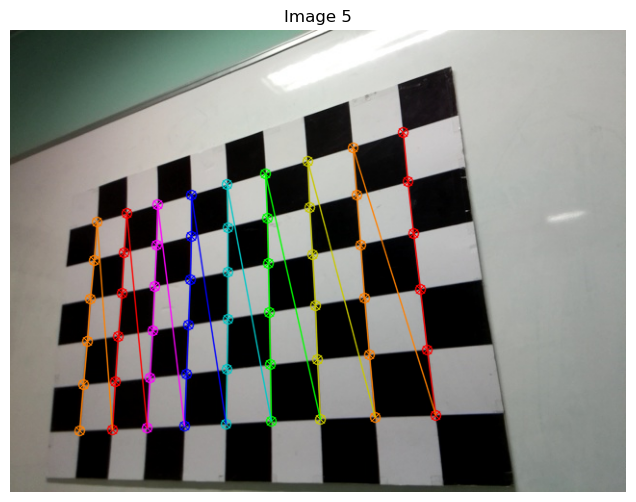

...

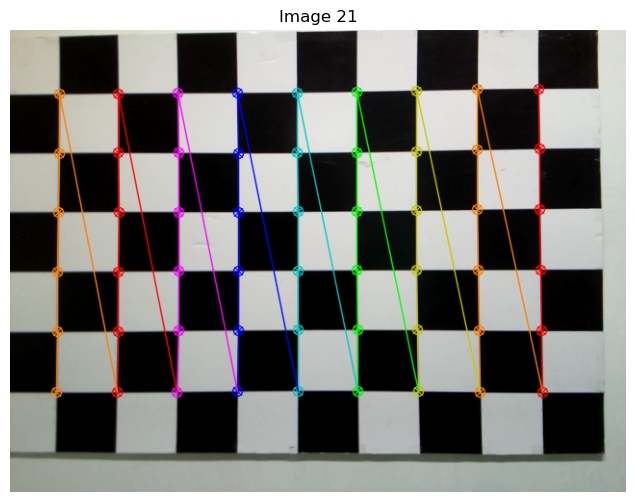

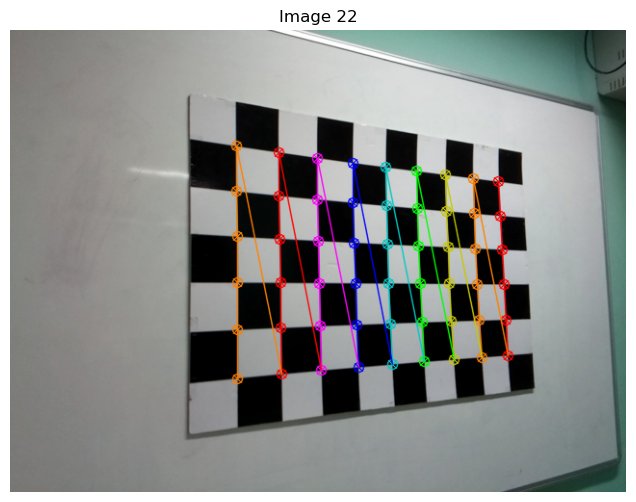

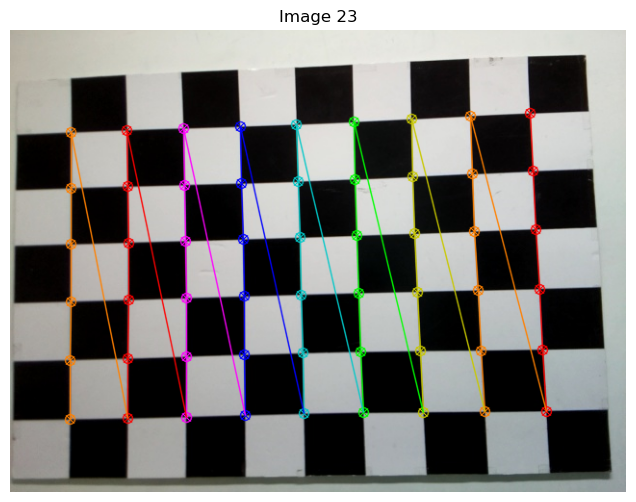

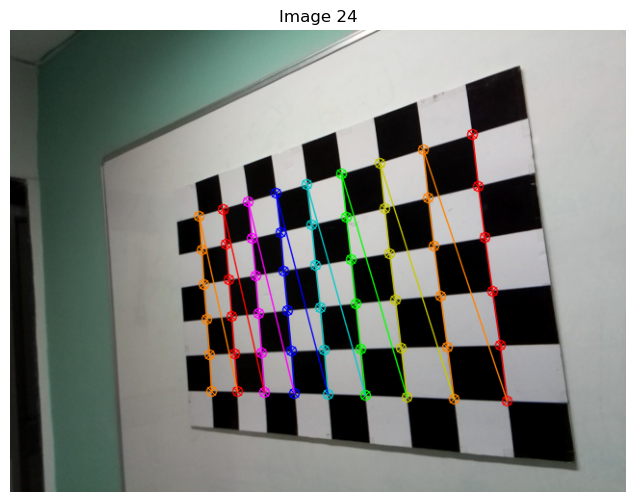

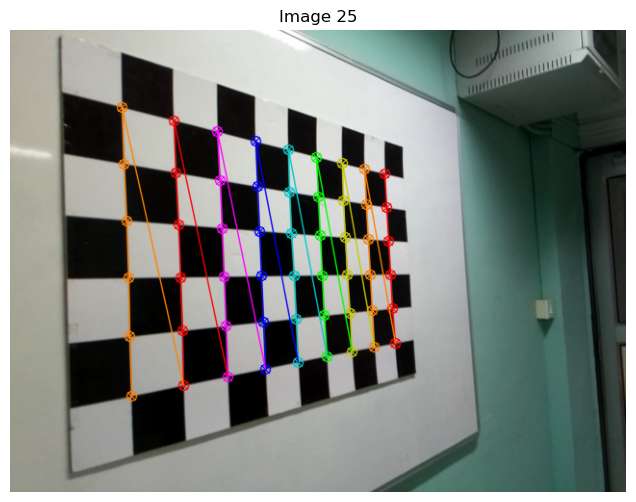

In [6]:


for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)
    
    if ret == True:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)
        cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
    
    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f'Image {idx+1}')
    plt.axis('off')
    plt.show()
    
    # img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2,ret)
h,w = img.shape[:2]
    
    


In [7]:
"""
Performing camera calibration by 
passing the value of known 3D points (objpoints)
and corresponding pixel coordinates of the 
detected corners (imgpoints)
"""
ret, camera_mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

print("Camera matrix : \n")
print(camera_mtx)
print("dist : \n")
print(dist)
print("rvecs : \n")
print(rvecs)
print("tvecs : \n")
print(tvecs)

Camera matrix : 

[[503.89363557   0.         313.6253279 ]
 [  0.         503.78495448 243.11523776]
 [  0.           0.           1.        ]]
dist : 

[[ 2.13948020e-01 -5.02307501e-01  1.68990569e-04 -2.01687721e-03
   2.94455904e-01]]
rvecs : 

(array([[0.78712592],
       [0.53316772],
       [1.52220814]]), array([[0.84694608],
       [0.19625432],
       [1.46468718]]), array([[-0.3389373 ],
       [-0.47324262],
       [ 1.59499208]]), array([[0.28248695],
       [0.58800616],
       [1.31943884]]), array([[0.1513192 ],
       [0.57131428],
       [1.41368822]]), array([[-0.1267066 ],
       [ 0.26600775],
       [ 1.52222679]]), array([[-0.19375594],
       [ 0.37273518],
       [ 1.55307078]]), array([[-0.3389373 ],
       [-0.47324262],
       [ 1.59499208]]), array([[ 0.11099534],
       [-0.46486051],
       [ 1.48279246]]), array([[-0.15899774],
       [ 0.05348491],
       [ 1.52011944]]), array([[-0.15416497],
       [ 0.40014619],
       [ 1.49233717]]), array([[0.424

In [8]:
# Reporting intrinsic parameters
focal_length_x = camera_mtx[0, 0]
focal_length_y = camera_mtx[1, 1]
principal_point_x = camera_mtx[0, 2]
principal_point_y = camera_mtx[1, 2]
skew = camera_mtx[0, 1]  # This value is expected to be zero or very close to zero

print("Intrinsic Camera Parameters:")
print(f"Focal Lengths: fx = {focal_length_x}, fy = {focal_length_y}")
print(f"Principal Point: cx = {principal_point_x}, cy = {principal_point_y}")
print(f"Skew: {skew} (usually close to zero and not reported unless significant)")
print("")

# Reporting extrinsic parameters for each image
for i in range(len(rvecs)):
    rotation_vector = rvecs[i]
    translation_vector = tvecs[i]
    rotation_matrix, _ = cv2.Rodrigues(rotation_vector)  # Convert rotation vector to rotation matrix
    
    print(f"Extrinsic Parameters for Image {i+1}:")
    print("Rotation Matrix:")
    print(rotation_matrix)
    print("Translation Vector:")
    print(translation_vector)
    print("")



Intrinsic Camera Parameters:
Focal Lengths: fx = 503.89363556568924, fy = 503.78495447720564
Principal Point: cx = 313.6253279027001, cy = 243.1152377599874
Skew: 0.0 (usually close to zero and not reported unless significant)

Extrinsic Parameters for Image 1:
Rotation Matrix:
[[ 0.01302682 -0.6677718   0.74425206]
 [ 0.98621993 -0.11418674 -0.11971481]
 [ 0.16492589  0.73555572  0.65708237]]
Translation Vector:
[[ 1.53399954]
 [-2.40218362]
 [ 8.17166201]]

Extrinsic Parameters for Image 2:
Rotation Matrix:
[[ 0.14782298 -0.78752817  0.59828734]
 [ 0.91725121 -0.11706069 -0.38071907]
 [ 0.36986292  0.60505882  0.70505691]]
Translation Vector:
[[ 1.07990536]
 [-2.10113555]
 [ 7.65276508]]

Extrinsic Parameters for Image 3:
Rotation Matrix:
[[-0.08185352 -0.8691266  -0.48776936]
 [ 0.99451061 -0.03921969 -0.09700757]
 [ 0.0651817  -0.49303221  0.8675659 ]]
Translation Vector:
[[ 5.0963751 ]
 [-2.62065208]
 [14.87756801]]

Extrinsic Parameters for Image 4:
Rotation Matrix:
[[ 0.13193875

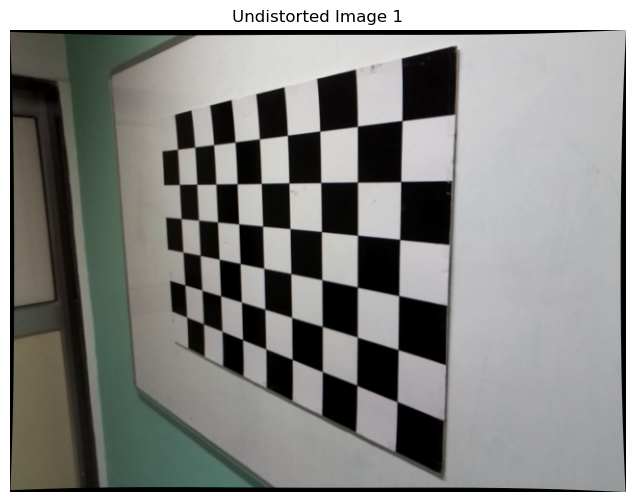

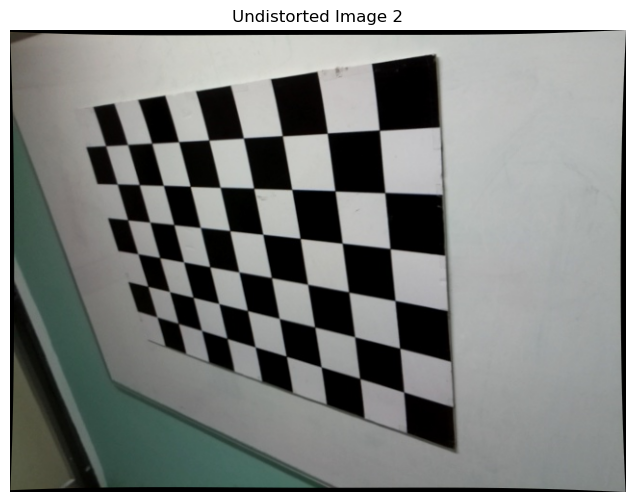

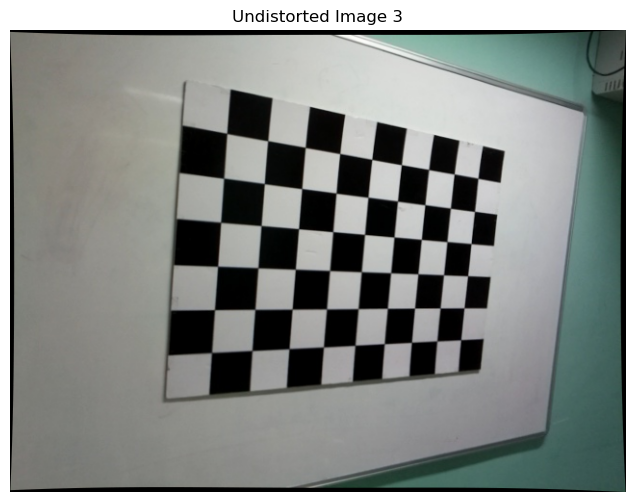

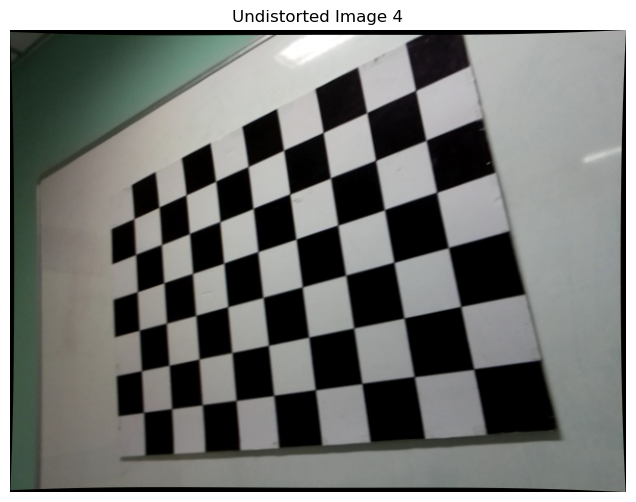

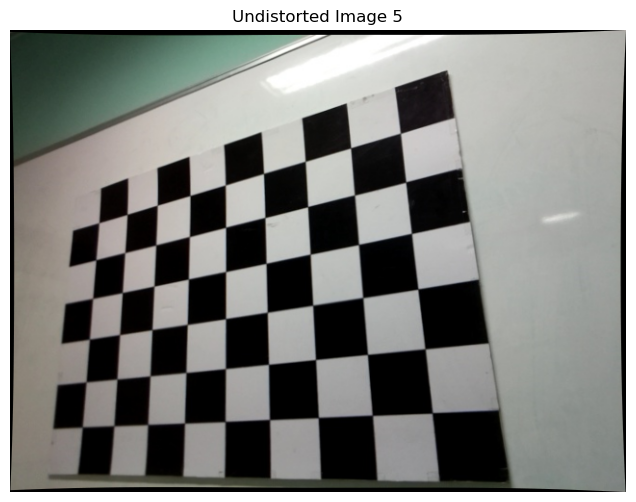

Radial Distortion Coefficients: k1 = 0.21394802026648435, k2 = -0.5023075006168253, k3 = 0.0001689905692570256


In [9]:
# #Q4 part 3

# # Using the derived camera parameters to undistort the image

# img = cv2.imread(images[0])
# # Refining the camera matrix using parameters obtained by calibration
# newcameramtx, roi = cv2.getOptimalNewCameraMatrix(camera_mtx, dist, (w,h), 1, (w,h))

# # Method 1 to undistort the image
# dst = cv2.undistort(img, camera_mtx, dist, None, newcameramtx)

# # Method 2 to undistort the image
# mapx,mapy=cv2.initUndistortRectifyMap(camera_mtx,dist,None,newcameramtx,(w,h),5)

# dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)

# # Displaying the undistorted image
# cv2.imshow("undistorted image",dst)
# cv2.waitKey(0)



import matplotlib.pyplot as plt



# Let's iterate through the first five images to undistort them and display
for i, fname in enumerate(images[:5]):
    img = cv2.imread(fname)  # Read the image
    new_camera_mtx, roi = cv2.getOptimalNewCameraMatrix(camera_mtx, dist, (w,h), 1, (w,h))

    # Undistort using the new camera matrix
    dst = cv2.undistort(img, camera_mtx, dist, None, new_camera_mtx)
    
    # Convert to RGB for displaying with matplotlib
    dst_rgb = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    
    # Plot the undistorted images
    plt.figure(figsize=(10, 6))
    plt.imshow(dst_rgb)
    plt.title(f'Undistorted Image {i+1}')
    plt.axis('off')
    plt.show()

# # Report the estimated radial distortion coefficients
# radial_distortion_coefficients = dist[:3]  # First three coefficients
# print(f"Radial Distortion Coefficients: {radial_distortion_coefficients}")

radial_distortion_coefficients = dist[0][:3]
print(f"Radial Distortion Coefficients: k1 = {radial_distortion_coefficients[0]}, k2 = {radial_distortion_coefficients[1]}, k3 = {radial_distortion_coefficients[2]}")





25


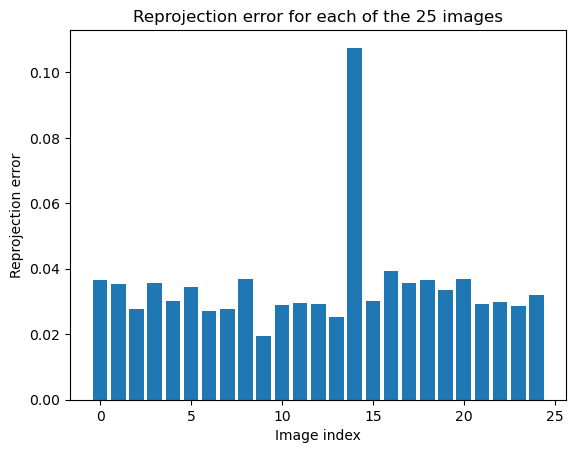

 Mean of the re-projection error : 0.034576722740669856
 Standard Deviation of the re-projection error: 0.015538676589880854


In [10]:
#Q4 part4

mean_error = 0
errors = []
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], camera_mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error
    errors.append(error)
mean_error /= len(objpoints)

print(len(objpoints))
# print(objpoints)


mean_reprojection_error = np.mean(errors)
stddev_reprojection_error = np.std(errors)

plt.bar(range(len(errors)), errors)
plt.xlabel('Image index')
plt.ylabel('Reprojection error')
plt.title('Reprojection error for each of the 25 images')
plt.show()

print(f" Mean of the re-projection error : {mean_reprojection_error}")
print(f" Standard Deviation of the re-projection error: {stddev_reprojection_error}")

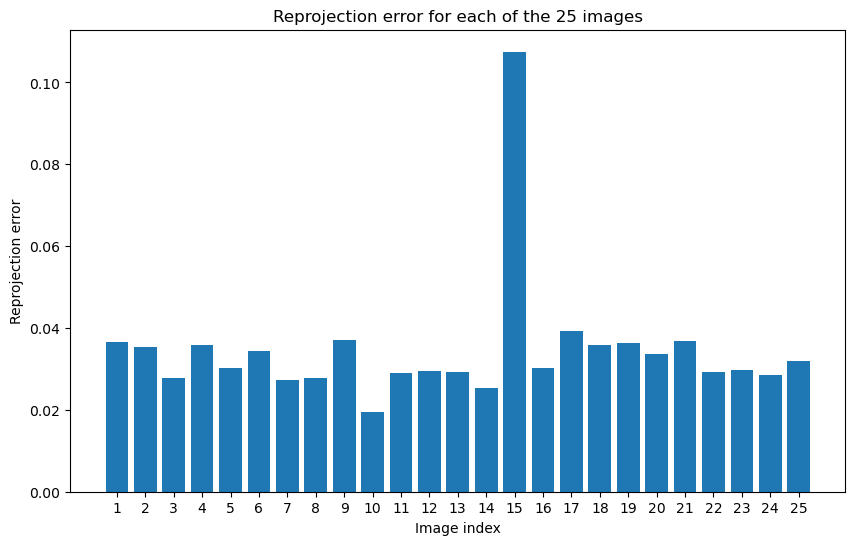

Mean of the reprojection error: 0.034576722740669856
Standard Deviation of the reprojection error: 0.015538676589880854


In [11]:
# Ensure that you only have data for the 25 images
assert len(objpoints) == 25
assert len(imgpoints) == 25

# Now calculate the reprojection errors
mean_error = 0
errors = []
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], camera_mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error
    errors.append(error)
mean_error /= len(objpoints)

# Calculate the mean and standard deviation of the reprojection errors
mean_reprojection_error = np.mean(errors)
stddev_reprojection_error = np.std(errors)

# Plot the errors
plt.figure(figsize=(10, 6)) # Adjust the size as needed
plt.bar(range(1, len(errors)+1), errors)  # Start the index at 1 for better readability
plt.xticks(range(1, len(errors)+1))  # Adjust the x-ticks to match image indices
plt.xlabel('Image index')
plt.ylabel('Reprojection error')
plt.title('Reprojection error for each of the 25 images')
plt.show()

# Print the mean and standard deviation
print(f"Mean of the reprojection error: {mean_reprojection_error}")
print(f"Standard Deviation of the reprojection error: {stddev_reprojection_error}")


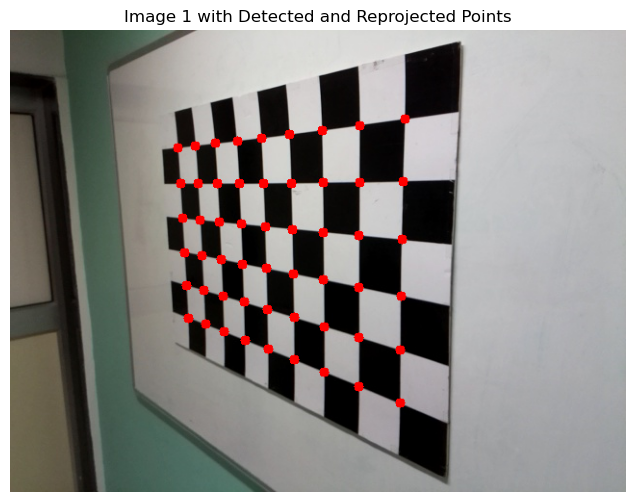

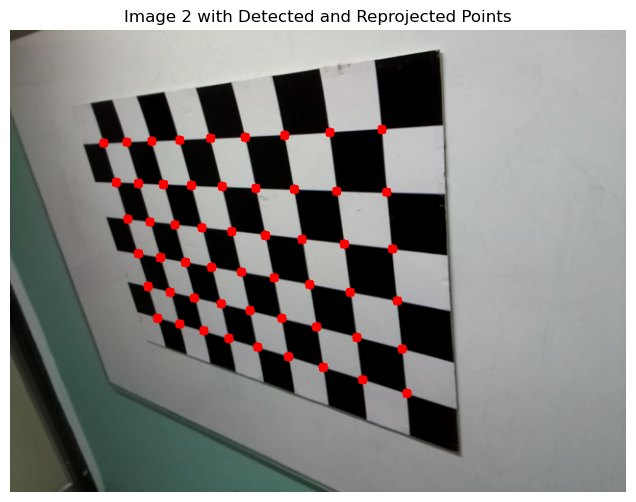

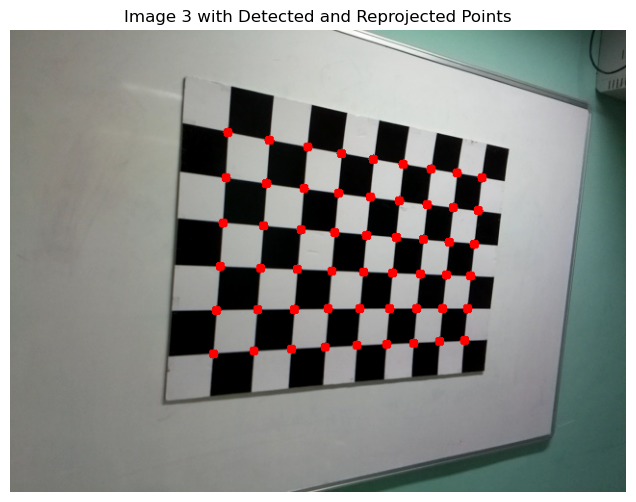

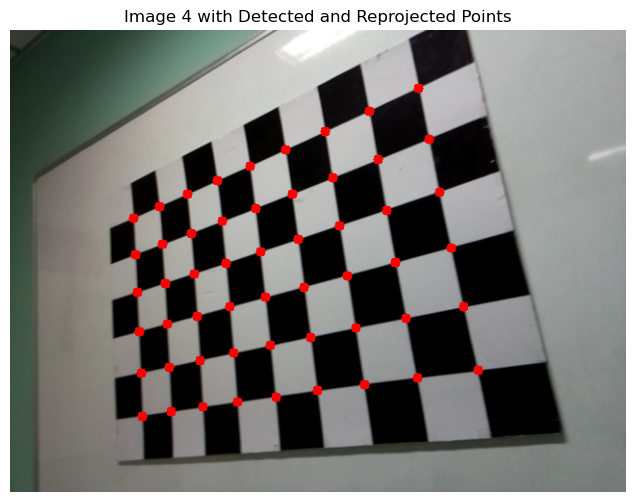

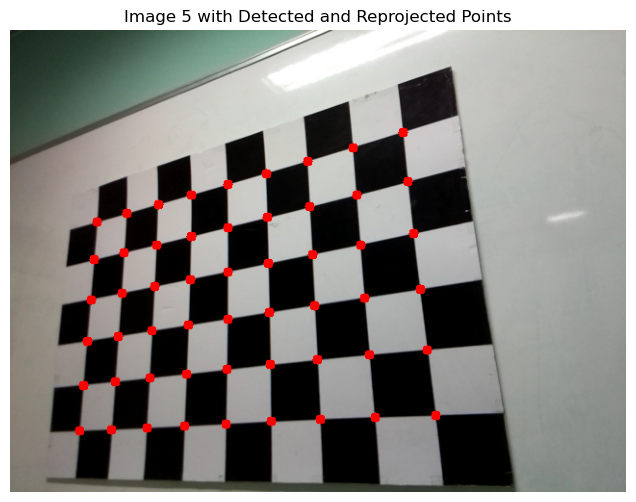

...

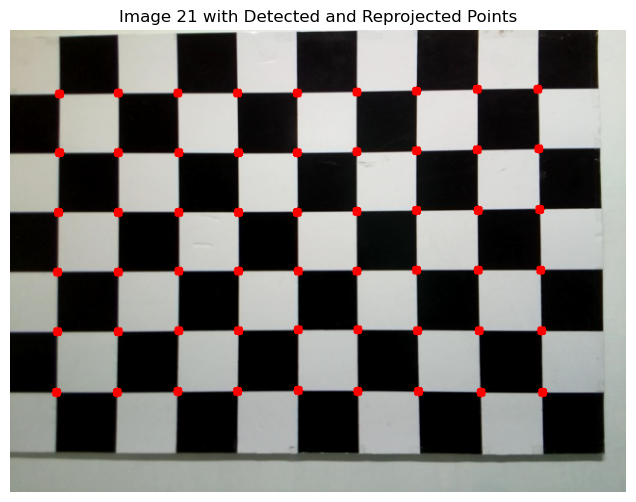

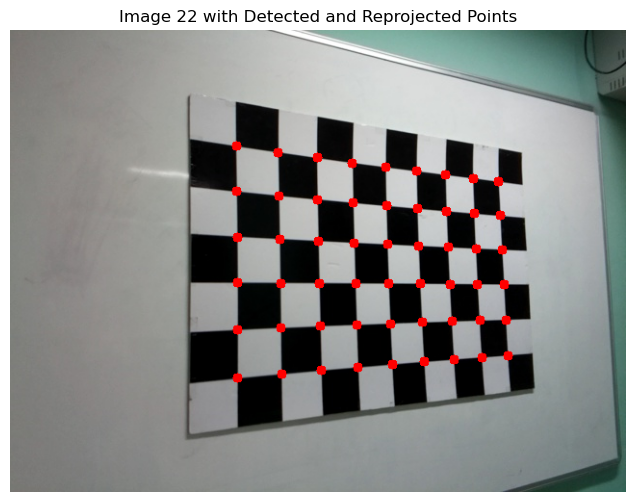

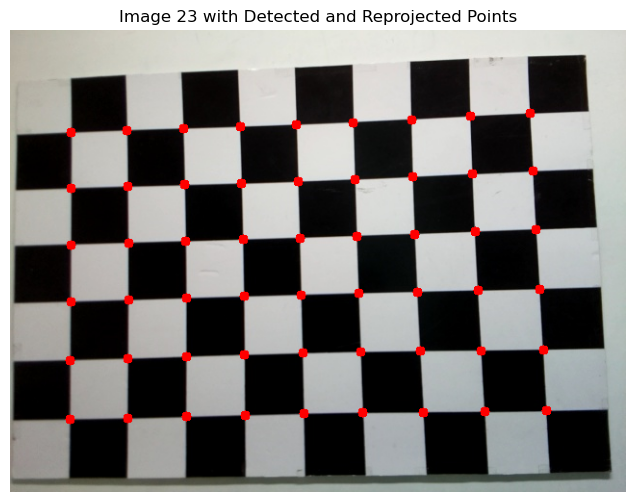

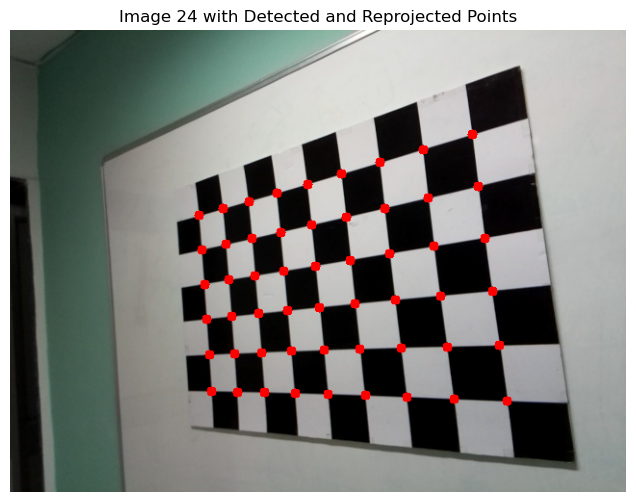

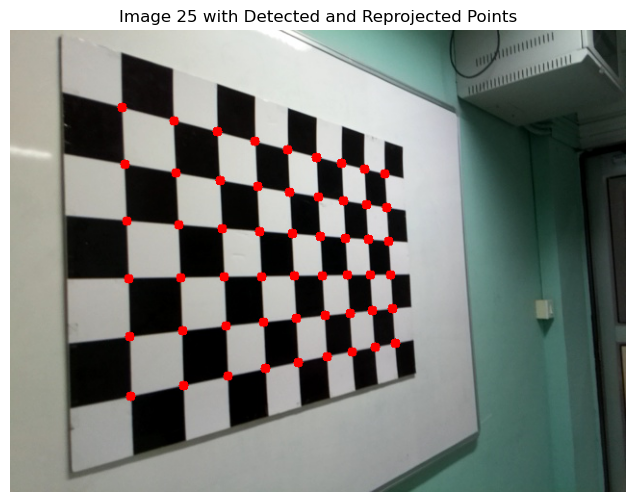

25


In [12]:
for i in range(len(objpoints)):
    # Read the image and convert it to RGB for matplotlib compatibility
    img = cv2.imread(images[i])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw the detected corners
    cv2.drawChessboardCorners(img, (CHECKERBOARD[0], CHECKERBOARD[1]), imgpoints[i], True)
    
    # Project the 3D object points to 2D image points
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], camera_mtx, dist)
    
    # Draw the reprojected corners
    imgpoints2 = np.rint(imgpoints2).astype(int)  # Convert to integer for drawing
    for p in imgpoints2:
        cv2.circle(img_rgb, (p[0][0], p[0][1]), 5, (255, 0, 0), -1)  # Blue circles
    
    # Plot the image with both the original and reprojected points
    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f'Image {i+1} with Detected and Reprojected Points')
    plt.axis('off')
    plt.show()


print(len(objpoints))

In [15]:
normals = []

for i in range(len(rvecs)):
    # Convert rotation vector to rotation matrix
    R, _ = cv2.Rodrigues(rvecs[i])
    
    # The z-axis in the object's coordinate frame
    z_axis = np.array([[0], [0], [1]])
    
    # The normal to the checkerboard in the camera coordinate frame
    normal = np.dot(R, z_axis)
    
    
    normals.append(normal)
    print(f"Normal for image {i+1}: {normal.ravel()}")


Normal for image 1: [ 0.74425206 -0.11971481  0.65708237]
Normal for image 2: [ 0.59828734 -0.38071907  0.70505691]
Normal for image 3: [-0.48776936 -0.09700757  0.8675659 ]
Normal for image 4: [0.55259191 0.13176815 0.82296983]
Normal for image 5: [0.46018437 0.23206869 0.85695652]
Normal for image 6: [0.0929275  0.24672066 0.96462086]
Normal for image 7: [0.11082764 0.35249367 0.92922842]
Normal for image 8: [-0.48776936 -0.09700757  0.8675659 ]
Normal for image 9: [-0.23142499 -0.35158055  0.90710175]
Normal for image 10: [-0.0641128   0.13719608  0.98846689]
Normal for image 11: [0.16396279 0.34247802 0.92510811]
Normal for image 12: [0.66703522 0.10041553 0.73822811]
Normal for image 13: [0.06867882 0.33478286 0.93978916]
Normal for image 14: [0.11110274 0.3709032  0.92200163]
Normal for image 15: [-0.03926346  0.12189277  0.99176637]
Normal for image 16: [0.46018437 0.23206869 0.85695652]
Normal for image 17: [-0.10210161  0.28884406  0.95191616]
Normal for image 18: [0.55259191 